<a href="https://colab.research.google.com/github/praveen1608/Praveen-Reddy_INFO5731_Spring2024/blob/main/Kadasani_PraveenReddy_Exercise_04.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **INFO5731 In-class Exercise 4**

**This exercise will provide a valuable learning experience in working with text data and extracting features using various topic modeling algorithms. Key concepts such as Latent Dirichlet Allocation (LDA), Latent Semantic Analysis (LSA), lda2vec, and BERTopic.**

***Please use the text corpus you collected in your last in-class-exercise for this exercise. Perform the following tasks***.

**Expectations**:
*   Students are expected to complete the exercise during lecture period to meet the active participation criteria of the course.
*   Use the provided .*ipynb* document to write your code & respond to the questions. Avoid generating a new file.
*   Write complete answers and run all the cells before submission.
*   Make sure the submission is "clean"; *i.e.*, no unnecessary code cells.
*   Once finished, allow shared rights from top right corner (*see Canvas for details*).

**Total points**: 40

**Deadline**: This in-class exercise is due at the end of the day tomorrow, at 11:59 PM.

**Late submissions will have a penalty of 10% of the marks for each day of late submission, and no requests will be answered. Manage your time accordingly.**


## Question 1 (10 Points)

**Generate K topics by using LDA, the number of topics K should be decided by the coherence score, then summarize what are the topics.**

You may refer the code here: https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/

In [1]:
# Write your code here

# Run in python console
import nltk; nltk.download('stopwords')

# Run in terminal or command prompt
!python3 -m spacy download en

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


⚠ As of spaCy v3.0, shortcuts like 'en' are deprecated. Please use the
full pipeline package name 'en_core_web_sm' instead.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 18.6 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [2]:
!pip install pyLDAvis   # instal pyLDAV


In [3]:
import re # importing the required libraries
import numpy as np
import pandas as pd
from pprint import pprint

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# spacy for lemmatization
import spacy

# Plotting tools
import pyLDAvis
import pyLDAvis.gensim  # don't skip this
import matplotlib.pyplot as plt
%matplotlib inline

# Enable logging for gensim - optional
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)

In [4]:
# NLTK Stop words
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use'])

In [5]:
import pandas as pd

# URL of the CSV file
url = 'https://github.com/praveen1608/Praveen-Reddy_INFO5731_Spring2024/raw/main/Killers%20of%20the%20Flower%20Moon_user_reviews_Ex_4.csv'

# Attempt to read the CSV file with different configurations
try:
    # Try reading with default parameters
    df = pd.read_csv(url)
except Exception as e:
    print("Error:", e)

# Print the first few lines of the file to inspect its structure
print("\nFirst few lines of the file:")
with pd.option_context('display.max_rows', 5, 'display.max_columns', None):
    print(pd.read_csv(url, nrows=5))





First few lines of the file:
                                        User Reviews
0  "Killers of the Flower Moon" is a Western crim...
1  Some films warrant long runtimes. Epics like '...
2  Martin Scorsese follows up his sloppy The Iris...
3  Obviously this isn't bad. It's from an amazing...
4  I'm not a die-hard Martin Scorsese fan. I have...


In [6]:
import re   # import the required libraries
import string
from pprint import pprint

# Convert to list
data = df['User Reviews'].values.tolist()

# Convert to lowercase
data = [sent.lower() for sent in data]

pprint(data[:1])



['"killers of the flower moon" is a western crime drama film co-written and '
 'directed by martin scorsese, based on the non-fiction book of the same name '
 'by david grann. starring leonardo dicaprio, robert de niro, and lily '
 'gladstone, it touches upon an often overlooked piece of american history in '
 'the best way possible thanks to the talents of its director and cast.in the '
 'early 1920s, the discovery of oil on land belonging to the native american '
 'osage nation turns the tribe into some of the richest people in the world. '
 'this sudden acquisition of wealth attracts the attention of white '
 'businessmen looking to seize the opportunity at stealing as much from the '
 'osage tribe as possible. among this group of interlopers is ernest burkhart '
 '(leonardo dicaprio), whom upon arriving in oklahoma is encouraged by his '
 'uncle william king hale (robert de niro) to marry a member of the osage as a '
 'way of inheriting their fortune. ernest soon falls in love with

In [7]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # removing the punctuations

data_words = list(sent_to_words(data))

print(data_words[:1])

[['killers', 'of', 'the', 'flower', 'moon', 'is', 'western', 'crime', 'drama', 'film', 'co', 'written', 'and', 'directed', 'by', 'martin', 'scorsese', 'based', 'on', 'the', 'non', 'fiction', 'book', 'of', 'the', 'same', 'name', 'by', 'david', 'grann', 'starring', 'leonardo', 'dicaprio', 'robert', 'de', 'niro', 'and', 'lily', 'gladstone', 'it', 'touches', 'upon', 'an', 'often', 'overlooked', 'piece', 'of', 'american', 'history', 'in', 'the', 'best', 'way', 'possible', 'thanks', 'to', 'the', 'talents', 'of', 'its', 'director', 'and', 'cast', 'in', 'the', 'early', 'the', 'discovery', 'of', 'oil', 'on', 'land', 'belonging', 'to', 'the', 'native', 'american', 'osage', 'nation', 'turns', 'the', 'tribe', 'into', 'some', 'of', 'the', 'richest', 'people', 'in', 'the', 'world', 'this', 'sudden', 'acquisition', 'of', 'wealth', 'attracts', 'the', 'attention', 'of', 'white', 'businessmen', 'looking', 'to', 'seize', 'the', 'opportunity', 'at', 'stealing', 'as', 'much', 'from', 'the', 'osage', 'tribe

In [8]:
import re
import spacy
from pprint import pprint
from gensim.utils import simple_preprocess
from nltk.corpus import stopwords
from nltk import bigrams, trigrams

# Define stopwords
stop_words = stopwords.words('english')

# Define functions for stopwords, bigrams, trigrams and lemmatization
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]


# Remove Stop Words
data_words_nostops = remove_stopwords(data_words)

print(data_words_nostops[:1])


[['killers', 'flower', 'moon', 'western', 'crime', 'drama', 'film', 'co', 'written', 'directed', 'martin', 'scorsese', 'based', 'non', 'fiction', 'book', 'name', 'david', 'grann', 'starring', 'leonardo', 'dicaprio', 'robert', 'de', 'niro', 'lily', 'gladstone', 'touches', 'upon', 'often', 'overlooked', 'piece', 'american', 'history', 'best', 'way', 'possible', 'thanks', 'talents', 'director', 'cast', 'early', 'discovery', 'oil', 'land', 'belonging', 'native', 'american', 'osage', 'nation', 'turns', 'tribe', 'richest', 'people', 'world', 'sudden', 'acquisition', 'wealth', 'attracts', 'attention', 'white', 'businessmen', 'looking', 'seize', 'opportunity', 'stealing', 'much', 'osage', 'tribe', 'possible', 'among', 'group', 'interlopers', 'ernest', 'burkhart', 'leonardo', 'dicaprio', 'upon', 'arriving', 'oklahoma', 'encouraged', 'uncle', 'william', 'king', 'hale', 'robert', 'de', 'niro', 'marry', 'member', 'osage', 'way', 'inheriting', 'fortune', 'ernest', 'soon', 'falls', 'love', 'later', 

In [9]:
# Create bigram and trigram models using Gensim's Phrases to find common phrases in the text data.
bigram = gensim.models.Phrases(data_words_nostops, min_count=5, threshold=100)  # higher threshold results in fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words_nostops], threshold=100)

# Create Phraser objects to efficiently apply the bigram and trigram models.
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

# Define a function 'remove_stopwords' to remove stop words from a list of tokenized texts.
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]

# Define a function 'make_bigrams' to apply the bigram model to a list of texts.
def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

# Define a function 'make_trigrams' to apply the trigram model to a list of texts.
def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

# Define a function 'lemmatization' to perform lemmatization on a list of texts, considering specified part-of-speech tags.
def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent))
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out


# Remove stop words from the tokenized reviews.
data_words_nostops = remove_stopwords(data_words)

# Apply the bigram model to the tokenized reviews.
data_words_bigrams = make_bigrams(data_words_nostops)

# Load the spaCy language model 'en_core_web_sm' and disable parser and named entity recognition (NER) components.
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])

# Perform lemmatization on the text data, considering specified part-of-speech tags.
data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

# Print the lemmatized data from the first review.
print(data_lemmatized[:1])

[['flower', 'western', 'crime', 'drama', 'film', 'direct', 'scorsese', 'base', 'fiction', 'book', 'name', 'star', 'lily', 'gladstone', 'touch', 'often', 'overlook', 'piece', 'american', 'history', 'good', 'way', 'possible', 'thank', 'talent', 'director', 'cast', 'early', 'discovery', 'oil', 'land', 'belong', 'native', 'american', 'osage', 'nation', 'turn', 'tribe', 'rich', 'people', 'world', 'sudden', 'acquisition', 'wealth', 'attract', 'attention', 'white', 'businessman', 'look', 'seize_opportunity', 'steal', 'much', 'osage', 'tribe', 'possible', 'group', 'interloper', 'arrive', 'encourage', 'marry', 'member', 'osage', 'way', 'inherit', 'fortune', 'soon', 'fall', 'later', 'marrie', 'mollie', 'lily', 'gladstone', 'young', 'osage', 'woman', 'strong', 'tie', 'family', 'riche', 'white', 'occupation', 'native', 'continue', 'member', 'osage', 'tribe', 'repeatedly', 'find', 'murdered_mysterious', 'circumstance', 'mollie', 'close', 'family', 'prominent_victim', 'favourite', 'thing', 'movie', 

In [10]:
review_id2word = corpora.Dictionary(data_lemmatized)
review_texts = data_lemmatized
review_corpus = [review_id2word.doc2bow(text) for text in review_texts]
print(review_corpus[:1])
[[(review_id2word[i], f) for i, f in c] for c in review_corpus[:1]]

[[(0, 1), (1, 1), (2, 1), (3, 3), (4, 1), (5, 1), (6, 2), (7, 1), (8, 2), (9, 1), (10, 1), (11, 2), (12, 1), (13, 1), (14, 1), (15, 2), (16, 1), (17, 1), (18, 1), (19, 1), (20, 1), (21, 2), (22, 1), (23, 1), (24, 2), (25, 1), (26, 1), (27, 1), (28, 1), (29, 1), (30, 3), (31, 1), (32, 1), (33, 1), (34, 1), (35, 1), (36, 1), (37, 1), (38, 1), (39, 1), (40, 1), (41, 1), (42, 1), (43, 1), (44, 1), (45, 1), (46, 1), (47, 1), (48, 5), (49, 1), (50, 2), (51, 1), (52, 1), (53, 1), (54, 1), (55, 1), (56, 1), (57, 1), (58, 1), (59, 1), (60, 1), (61, 1), (62, 1), (63, 1), (64, 1), (65, 1), (66, 1), (67, 1), (68, 2), (69, 1), (70, 1), (71, 1), (72, 1), (73, 1), (74, 1), (75, 1), (76, 1), (77, 1), (78, 1), (79, 2), (80, 1), (81, 1), (82, 4), (83, 1), (84, 1), (85, 1), (86, 1), (87, 2), (88, 1), (89, 1), (90, 1), (91, 1), (92, 2), (93, 1), (94, 1), (95, 1), (96, 1), (97, 1), (98, 3), (99, 2), (100, 1), (101, 1), (102, 1), (103, 1), (104, 3), (105, 1), (106, 1), (107, 1), (108, 3), (109, 1), (110, 2)

[[('able', 1),
  ('accumulate', 1),
  ('acquisition', 1),
  ('action', 3),
  ('actor', 1),
  ('actuality_metaphor', 1),
  ('addition', 2),
  ('additionally', 1),
  ('ahead', 2),
  ('ailment', 1),
  ('air', 1),
  ('almost', 2),
  ('already', 1),
  ('also', 1),
  ('alternate', 1),
  ('american', 2),
  ('antagonist', 1),
  ('anybody_manage', 1),
  ('arrive', 1),
  ('atmosphere', 1),
  ('attempting_steal', 1),
  ('attention', 2),
  ('attentive', 1),
  ('attract', 1),
  ('audience', 2),
  ('aware', 1),
  ('away', 1),
  ('back', 1),
  ('bad', 1),
  ('base', 1),
  ('believe', 3),
  ('belong', 1),
  ('belove', 1),
  ('bidding_pull', 1),
  ('birth', 1),
  ('book', 1),
  ('brightness', 1),
  ('bring', 1),
  ('build', 1),
  ('burkhart', 1),
  ('businessman', 1),
  ('career', 1),
  ('cast', 1),
  ('casual_viewer', 1),
  ('century', 1),
  ('certain', 1),
  ('certainly', 1),
  ('chance', 1),
  ('character', 5),
  ('child', 1),
  ('choose', 2),
  ('cinematic', 1),
  ('cinematography', 1),
  ('circums

In [11]:
review_id2word[0]


'able'

In [12]:
# Import the 'pprint' function for pretty-printing output.
from pprint import pprint

# Create an LDA (Latent Dirichlet Allocation) model using Gensim's 'ldamodel.LdaModel'.
lda_model = gensim.models.ldamodel.LdaModel(
    corpus=review_corpus,  # The bag-of-words corpus of the text data.
    id2word=review_id2word,  # The dictionary mapping word IDs to words.
    num_topics=20,  # The number of topics to identify.
    random_state=100,  # Set a random state for reproducibility.
    update_every=1,  # How often to update the model.
    chunksize=100,  # The number of documents to use in each training chunk.
    passes=10,  # The number of times the entire corpus should be iterated.
    alpha='auto',  # Automatic setting for the alpha hyperparameter.
    per_word_topics=True  # Return per-word topic probabilities.
)

# Print the topics discovered by the LDA model.
pprint(lda_model.print_topics())

# Apply the LDA model to the document corpus to obtain topic distributions.
doc_lda = lda_model[review_corpus]

[(0,
  '0.019*"story" + 0.015*"tell" + 0.015*"mollie" + 0.015*"osage" + '
  '0.015*"really" + 0.015*"well" + 0.011*"scorsese" + 0.011*"seem" + '
  '0.011*"film" + 0.011*"gladstone"'),
 (1,
  '0.022*"osage" + 0.020*"film" + 0.015*"tribe" + 0.015*"make" + '
  '0.012*"scorsese" + 0.010*"way" + 0.010*"family" + 0.008*"character" + '
  '0.008*"place" + 0.008*"mollie"'),
 (2,
  '0.001*"machiavellian" + 0.001*"locale" + 0.001*"montages_round" + '
  '0.001*"missed_opportunitie" + 0.001*"misguided" + 0.001*"martin" + '
  '0.001*"marriage" + 0.001*"marooned_temp" + 0.001*"machine" + 0.001*"none"'),
 (3,
  '0.043*"long" + 0.037*"film" + 0.025*"hour" + 0.019*"time" + 0.019*"end" + '
  '0.012*"form" + 0.012*"story" + 0.012*"interesting" + 0.012*"love" + '
  '0.012*"wish"'),
 (4,
  '0.051*"film" + 0.043*"story" + 0.026*"scene" + 0.026*"end" + 0.026*"make" + '
  '0.026*"whole" + 0.026*"character" + 0.017*"feel" + 0.017*"provide" + '
  '0.017*"get"'),
 (5,
  '0.029*"movie" + 0.018*"book" + 0.015*"feel

In [13]:
# Calculate the coherence score for the LDA model using the 'CoherenceModel' from Gensim.
coherence_model_lda = CoherenceModel(
    model=lda_model,  # The LDA model to evaluate.
    texts=data_lemmatized,  # The lemmatized text data.
    dictionary=review_id2word,  # The dictionary mapping word IDs to words.
    coherence='c_v'  # Specify the coherence measure to use ('c_v' in this case).
)

# Obtain the coherence score.
coherence_lda = coherence_model_lda.get_coherence()

# Print the computed coherence score.
print('\nCoherence Score: ', coherence_lda)



Coherence Score:  0.396643985727803


In [14]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Calculate coherence values for LDA models with varying numbers of topics.

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Maximum number of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to LDA models with different numbers of topics
    """
    coherence_values = []
    model_list = []

    for num_topics in range(start, limit, step):
        # Create an LDA model with the specified number of topics.
        model = gensim.models.ldamodel.LdaModel(
            corpus=corpus,  # The bag-of-words corpus of the text data.
            id2word=dictionary,  # The dictionary mapping word IDs to words.
            num_topics=num_topics,  # Number of topics to identify.
            random_state=100,  # Set a random state for reproducibility.
            update_every=1,  # How often to update the model.
            chunksize=100,  # The number of documents to use in each training chunk.
            passes=10,  # The number of times the entire corpus should be iterated.
            alpha='auto',  # Automatic setting for the alpha hyperparameter.
            per_word_topics=True  # Return per-word topic probabilities.
        )

        model_list.append(model)

        # Calculate the coherence score using the 'CoherenceModel' for the current model.
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')

        # Append the coherence value to the list.
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

# Specify parameters for the number of topics to evaluate.
start, limit, step = 2, 30, 2

# Call the 'compute_coherence_values' function to compute coherence values for various LDA models.
model_list, coherence_values = compute_coherence_values(
    dictionary=review_id2word,  # The dictionary mapping word IDs to words.
    corpus=review_corpus,  # The bag-of-words corpus of the text data.
    texts=data_lemmatized,  # The lemmatized text data.
    start=start, limit=limit, step=step  # Parameters for the number of topics to evaluate.
)

# Store and print the computed coherence values for each number of topics.
cohe_val = []
for m, cv in zip(range(start, limit, step), coherence_values):
    cohe_val.append(round(cv, 4))
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

Num Topics = 2  has Coherence Value of 0.18
Num Topics = 4  has Coherence Value of 0.2585
Num Topics = 6  has Coherence Value of 0.2754
Num Topics = 8  has Coherence Value of 0.3451
Num Topics = 10  has Coherence Value of 0.3117
Num Topics = 12  has Coherence Value of 0.2887
Num Topics = 14  has Coherence Value of 0.4066
Num Topics = 16  has Coherence Value of 0.3759
Num Topics = 18  has Coherence Value of 0.4
Num Topics = 20  has Coherence Value of 0.3966
Num Topics = 22  has Coherence Value of 0.4532
Num Topics = 24  has Coherence Value of 0.4504
Num Topics = 26  has Coherence Value of 0.4535
Num Topics = 28  has Coherence Value of 0.4679


In [15]:
sum(cohe_val)/len(cohe_val)


0.3616785714285714

In [16]:
# Choose the optimal LDA model from the list of models (index 3 in this case, corresponding to 8 topics).
optimal_model = model_list[3]

# Get the topics of the chosen LDA model.
model_topics = optimal_model.show_topics(formatted=False)

# Pretty-print the top 10 words for each topic in the LDA model.
pprint(optimal_model.print_topics(num_words=10))

[(0,
  '0.033*"story" + 0.019*"tell" + 0.016*"osage" + 0.016*"mollie" + '
  '0.014*"really" + 0.011*"well" + 0.011*"great" + 0.008*"hour" + 0.008*"act" '
  '+ 0.008*"give"'),
 (1,
  '0.022*"osage" + 0.020*"film" + 0.013*"make" + 0.013*"tribe" + '
  '0.010*"scorsese" + 0.009*"way" + 0.009*"family" + 0.009*"mollie" + '
  '0.009*"people" + 0.007*"gladstone"'),
 (2,
  '0.081*"film" + 0.023*"people" + 0.023*"hour" + 0.023*"slow" + 0.023*"story" '
  '+ 0.023*"endless" + 0.023*"leave" + 0.023*"good" + 0.023*"half" + '
  '0.023*"oscar"'),
 (3,
  '0.024*"film" + 0.016*"hour" + 0.016*"long" + 0.014*"story" + 0.012*"end" + '
  '0.012*"love" + 0.010*"really" + 0.010*"people" + 0.010*"time" + '
  '0.008*"gladstone"'),
 (4,
  '0.042*"film" + 0.031*"story" + 0.023*"make" + 0.015*"tell" + '
  '0.015*"scorsese" + 0.015*"character" + 0.012*"humor" + 0.012*"whole" + '
  '0.012*"scene" + 0.012*"end"'),
 (5,
  '0.027*"movie" + 0.016*"go" + 0.016*"feel" + 0.016*"story" + 0.015*"much" + '
  '0.013*"make" + 0

## Question 2 (10 Points)

**Generate K topics by using LSA, the number of topics K should be decided by the coherence score, then summarize what are the topics.**

You may refer the code here: https://www.datacamp.com/community/tutorials/discovering-hidden-topics-python

In [17]:
# Write your code here
# Imporing the LsiModel class from Gensim.
from gensim.models import LsiModel

# Creating an LSI model using Gensim's 'LsiModel'.
lsamodel = LsiModel(
    review_corpus,  # The bag-of-words corpus of the text data.
    num_topics=10,  # The number of topics for identifing.
    id2word=review_id2word  # The dictionary mapping word IDs to words.
)

# Print the top 10 words for each of the 15 topics in the LSI model.
print(lsamodel.print_topics(num_topics=15, num_words=10))

[(0, '0.378*"film" + 0.283*"osage" + 0.225*"scorsese" + 0.202*"make" + 0.196*"story" + 0.192*"character" + 0.129*"tribe" + 0.127*"mollie" + 0.124*"way" + 0.124*"movie"'), (1, '0.237*"tribe" + -0.195*"story" + 0.174*"osage" + -0.142*"movie" + -0.139*"tell" + 0.133*"family" + 0.127*"place" + -0.123*"hour" + -0.120*"feel" + -0.117*"narrative"'), (2, '-0.327*"movie" + -0.231*"feel" + -0.214*"story" + 0.203*"scorsese" + 0.178*"osage" + -0.146*"really" + 0.133*"narrative" + -0.132*"hour" + -0.125*"well" + -0.119*"way"'), (3, '0.246*"movie" + -0.238*"really" + -0.193*"mollie" + -0.152*"story" + -0.150*"tell" + -0.147*"well" + -0.140*"gladstone" + -0.118*"osage" + -0.114*"seem" + -0.111*"far"'), (4, '-0.319*"film" + 0.291*"movie" + 0.265*"book" + 0.175*"character" + -0.157*"long" + 0.140*"well" + 0.137*"part" + -0.129*"story" + 0.123*"murder" + 0.122*"event"'), (5, '-0.215*"love" + -0.203*"really" + 0.184*"way" + 0.169*"think" + 0.149*"final" + 0.146*"people" + 0.144*"evil" + -0.119*"start" + 

In [18]:
def comp_lsa_cohe_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Calculate coherence values for LSA models with varying numbers of topics.

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Maximum number of topics

    Returns:
    -------
    model_list : List of LSA models
    coherence_values : Coherence values corresponding to LSA models with different numbers of topics
    """
    coherence_values = []
    model_list = []

    for num_topics in range(start, limit, step):
        # Create an LSA model with the specified number of topics.
        lsamodel = LsiModel(corpus, num_topics=num_topics, id2word=dictionary)
        model_list.append(lsamodel)

        # Calculate the coherence score using the 'CoherenceModel' for the current LSA model.
        coherencemodel = CoherenceModel(model=lsamodel, texts=texts, dictionary=dictionary, coherence='c_v')

        # Append the coherence value to the list.
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values


# Specify parameters for the number of topics to evaluate.
start, limit, step = 2, 20, 2

# Call the 'comp_lsa_cohe_values' function to compute coherence values for various LSA models.
model_lsa, coherence_values = comp_lsa_cohe_values(
    dictionary=review_id2word,  # The dictionary mapping word IDs to words.
    corpus=review_corpus,  # The bag-of-words corpus of the text data.
    texts=data_lemmatized,  # The lemmatized text data.
    start=start, limit=limit, step=step  # Parameters for the number of topics to evaluate.
)

# Store and print the computed coherence values for each number of topics.
coherence_values_all = []
for m, cv in zip(range(start, limit, step), coherence_values):
    coherence_values_all.append(round(cv, 4))
    print("Topic no =", m, ", it's Coherence Value is", round(cv, 4))

Topic no = 2 , it's Coherence Value is 0.3098
Topic no = 4 , it's Coherence Value is 0.349
Topic no = 6 , it's Coherence Value is 0.3433
Topic no = 8 , it's Coherence Value is 0.424
Topic no = 10 , it's Coherence Value is 0.3959
Topic no = 12 , it's Coherence Value is 0.399
Topic no = 14 , it's Coherence Value is 0.3177
Topic no = 16 , it's Coherence Value is 0.3425
Topic no = 18 , it's Coherence Value is 0.3378


In [19]:
# Calculating the coherence score for the LSA model using the 'CoherenceModel' from Gensim.
coherencemodel = CoherenceModel(
    model=lsamodel,  # LSA model to evaluate.
    texts=data_lemmatized,  # lemmatized text data.
    dictionary=review_id2word,  # dictionary mapping word IDs to words.
    coherence='c_v'  # Specify the coherence measure to use ('c_v' in this case).
)

# Print computed coherence score.
print(coherencemodel.get_coherence())

0.3457291285689095


In [20]:
# average coherence value by summing all the coherence values and dividing by the total number of values.
average_coherence = sum(coherence_values_all) / len(coherence_values_all)

# Print computed average coherence value.
print("Average Coherence Value:", average_coherence)

Average Coherence Value: 0.35766666666666663


## Question 3 (10 points):
**Generate K topics by using lda2vec, the number of topics K should be decided by the coherence score, then summarize what are the topics.**

You may refer the code here: https://nbviewer.org/github/cemoody/lda2vec/blob/master/examples/twenty_newsgroups/lda2vec/lda2vec.ipynb

In [21]:
# Write your code here

nltk.download('all')   # Downloading all NLTK data packages.

!pip install preprocess  # Installing the 'preprocess' package using pip.

# Import necessary libraries
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

# Initialize the pyLDAvis library for interactive visualization.
import pyLDAvis
pyLDAvis.enable_notebook()


[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to /root/nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package alpino to /root/nltk_data...
[nltk_data]    |   Package alpino is already up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger is already up-
[nltk_data]    |       to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger_ru to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger_ru is already
[nltk_data]    |       up-to-date!
[nltk_data]    | Downloading package basque_grammars to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package basque_grammars is already up-to-date!
[nltk_data]    | Downloading package bcp47 to /root/nltk_data...
[nltk_data]    |   Package bcp47 is already up-to-dat

In [22]:
# Initialize the number of top words to extract per topic.
top_value = 10

top_topic_words = {}   # Creating a dictionary to store the top words.

for j, topic_to_word in enumerate(df['User Reviews'].values.tolist()):
    top_words = np.argsort(topic_to_word)[::-1][:top_value]   # Sorting the words in desc order based on the importance of the topic.

    # Prepare a message to display the topic and its top words.
    msg = 'Topic %i ' % j
    top_words_list = [df['User Reviews'].values.tolist()[i].strip()[:35] for i in top_words]
    msg += 'has stop words '.join(top_words_list)


    print(msg)   # Printing message.

    top_topic_words[j] = top_words_list    # Store top words for current topic in the dictionary.

Topic 0 "Killers of the Flower Moon" is a W
Topic 1 "Killers of the Flower Moon" is a W
Topic 2 "Killers of the Flower Moon" is a W
Topic 3 "Killers of the Flower Moon" is a W
Topic 4 "Killers of the Flower Moon" is a W
Topic 5 "Killers of the Flower Moon" is a W
Topic 6 "Killers of the Flower Moon" is a W
Topic 7 "Killers of the Flower Moon" is a W
Topic 8 "Killers of the Flower Moon" is a W
Topic 9 "Killers of the Flower Moon" is a W
Topic 10 "Killers of the Flower Moon" is a W
Topic 11 "Killers of the Flower Moon" is a W
Topic 12 "Killers of the Flower Moon" is a W
Topic 13 "Killers of the Flower Moon" is a W
Topic 14 "Killers of the Flower Moon" is a W
Topic 15 "Killers of the Flower Moon" is a W
Topic 16 "Killers of the Flower Moon" is a W
Topic 17 "Killers of the Flower Moon" is a W
Topic 18 "Killers of the Flower Moon" is a W
Topic 19 "Killers of the Flower Moon" is a W
Topic 20 "Killers of the Flower Moon" is a W
Topic 21 "Killers of the Flower Moon" is a W
Topic 22 "Killers of

<BarContainer object of 20 artists>

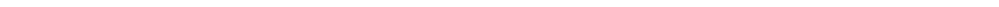

In [23]:
plt.bar(np.arange(20), df['User Reviews'].values.tolist()[1])

## Question 4 (10 points):
**Generate K topics by using BERTopic, the number of topics K should be decided by the coherence score, then summarize what are the topics.**

You may refer the code here: https://colab.research.google.com/drive/1FieRA9fLdkQEGDIMYl0I3MCjSUKVF8C-?usp=sharing

In [24]:
# Write your code here
!pip install bertopic

In [25]:
# Import the BERTopic library.
from bertopic import BERTopic

# Creating a BERTopic model with specific configuration.
topic_model = BERTopic(
    language="english",
    calculate_probabilities=True,  # Calculating topic probabilities.
    verbose=True  # Enable verbose mode for more detailed output.
)

topics, probs = topic_model.fit_transform(df['User Reviews'].values.tolist())   # Fit the BERTopic model to the list of text reviews.

# Get the topic information and store it in the 'frequency' DataFrame.
frequency = topic_model.get_topic_info()

# Display the top 5 rows of the 'frequency' DataFrame to inspect the topic information.
frequency.head(5)

2024-03-29 02:33:21,908 - BERTopic - Embedding - Transforming documents to embeddings.


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/32 [00:00<?, ?it/s]

2024-03-29 02:36:45,161 - BERTopic - Embedding - Completed ✓
2024-03-29 02:36:45,171 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-03-29 02:37:09,076 - BERTopic - Dimensionality - Completed ✓
2024-03-29 02:37:09,079 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-03-29 02:37:09,226 - BERTopic - Cluster - Completed ✓
2024-03-29 02:37:09,255 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-03-29 02:37:09,803 - BERTopic - Representation - Completed ✓


,Topic,Count,Name,Representation,Representative_Docs
0,0,40,0_of_to_the_as,"[of, to, the, as, his, is, in, osage, her, this]","[""Killers of the Flower Moon"" is a Western cri..."
1,1,40,1_the_of_and_is,"[the, of, and, is, on, are, characters, or, ki...",[Some films warrant long runtimes. Epics like ...
2,2,40,2_that_humor_this_off,"[that, humor, this, off, crimes, was, so, any,...",[I'll start off by saying that I wanted to be ...
3,3,40,3_cinema_during_for_far,"[cinema, during, for, far, mini, take, to, wat...",[Sorry to say that this was far too long for t...
4,4,40,4_cinema_incredible_number_see,"[cinema, incredible, number, see, an, you, did...","[This is what cinema is all about, a wonderful..."


In [26]:
topic_model.get_topic(-1)

False

In [27]:
# Visualize the term rank for topics using the topic_model.
topic_model.visualize_term_rank()

In [28]:
topic_model.update_topics(df['User Reviews'].values.tolist(), n_gram_range=(1, 2))
topic_model.visualize_term_rank()

## **Question 3 (Alternative) - (10 points)**

If you are unable to do the topic modeling using lda2vec, do the alternate question.

Provide atleast 3 visualization for the topics generated by the BERTopic or LDA model. Explain each of the visualization in detail.

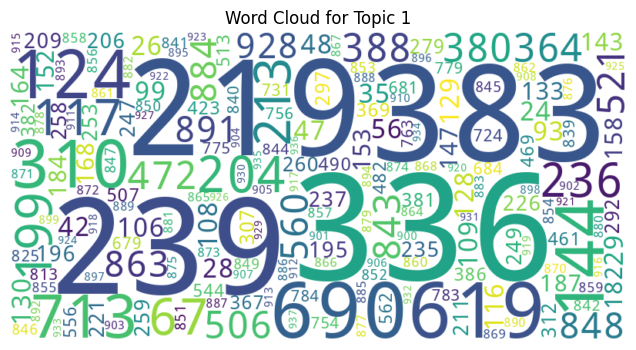

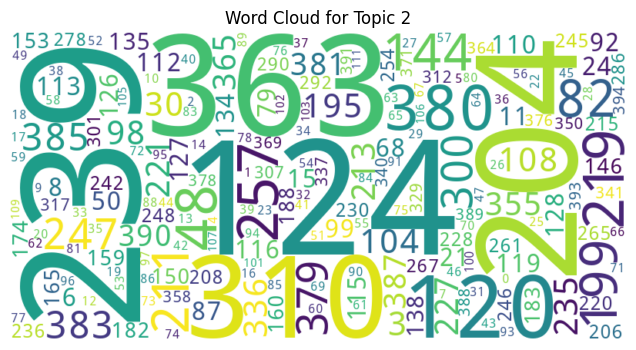

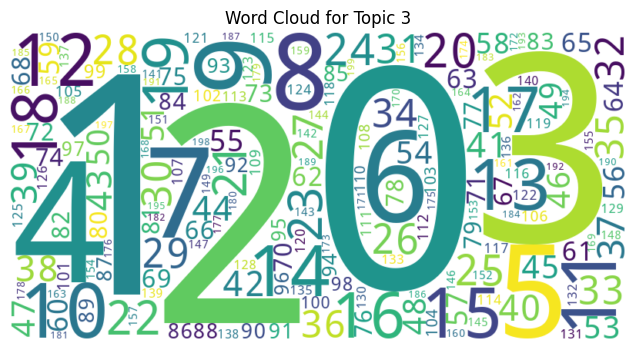

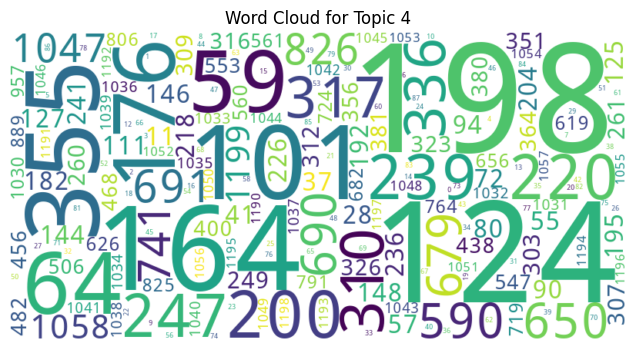

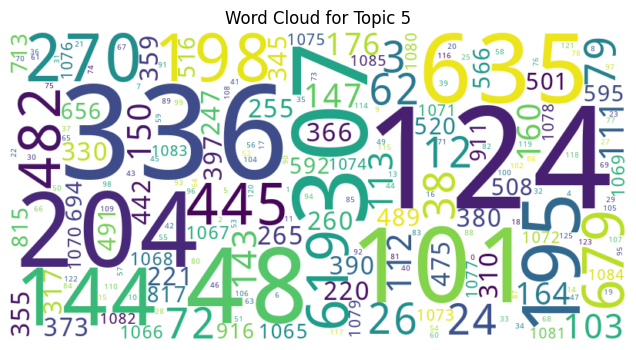

...

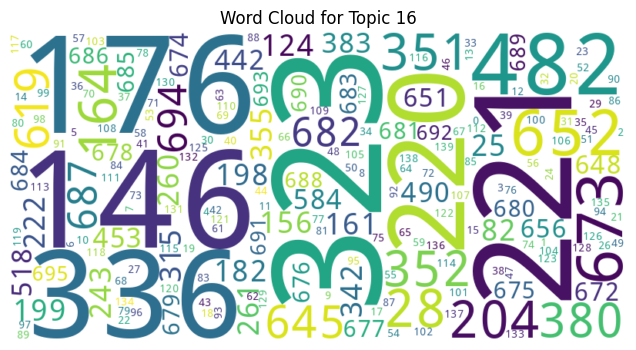

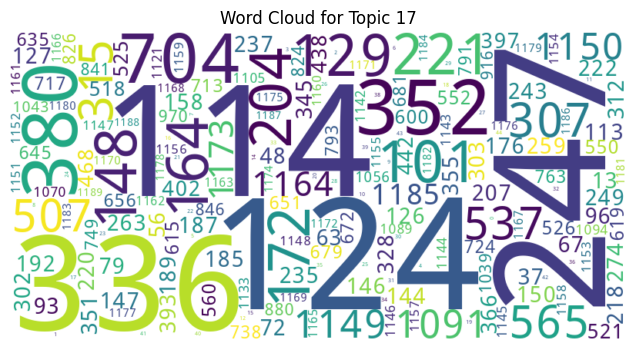

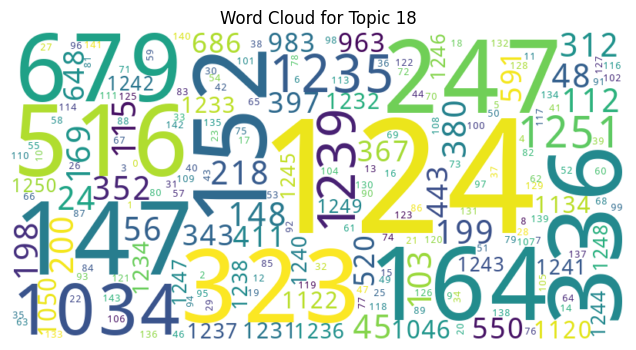

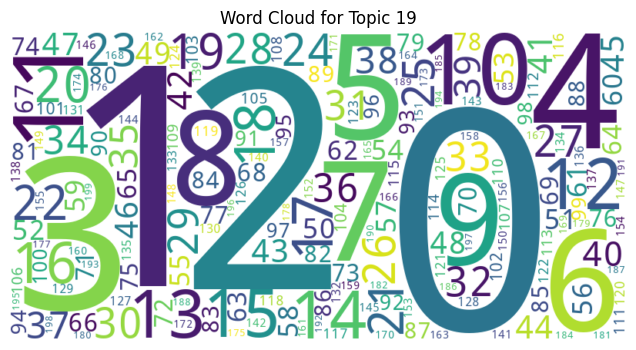

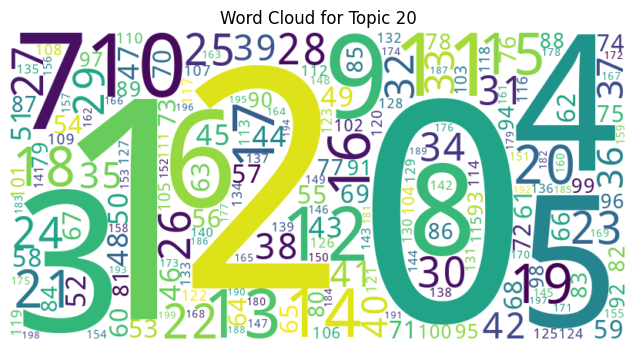

In [33]:
# Write your code here
# Then Explain the visualization

import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Assuming lda_model is your trained LDA model

# Get the topic-word distributions
topic_word_distributions = lda_model.get_topics()

# 1. Word Clouds for Topics
for i, word_dist in enumerate(topic_word_distributions):
    # Convert numpy array to dictionary
    word_dist_dict = {str(word_idx): freq for word_idx, freq in enumerate(word_dist)}
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_dist_dict)
    plt.figure(figsize=(8, 4))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for Topic {i+1}')
    plt.axis('off')
    plt.show()





**Explanation:** Word clouds are famous visualization method to represent the most occuring words in each topic.The size is related to the frequency in the topic. It provides an overview very quickly. They can easy to interpret and  can be understood by even non technical people. Here each word cloud represents a topic in LDA model. These are the most frequent words related to topic.

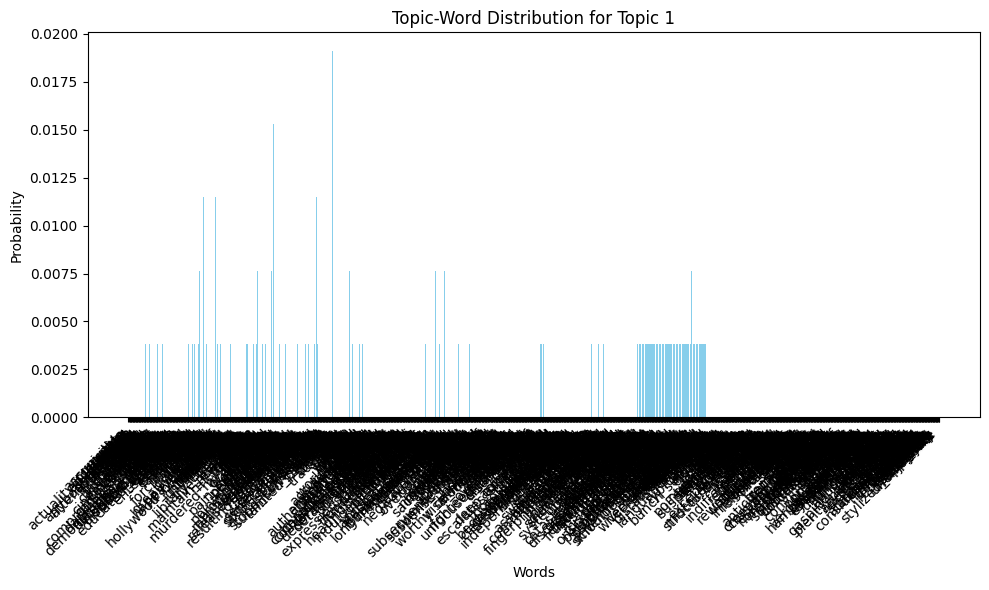

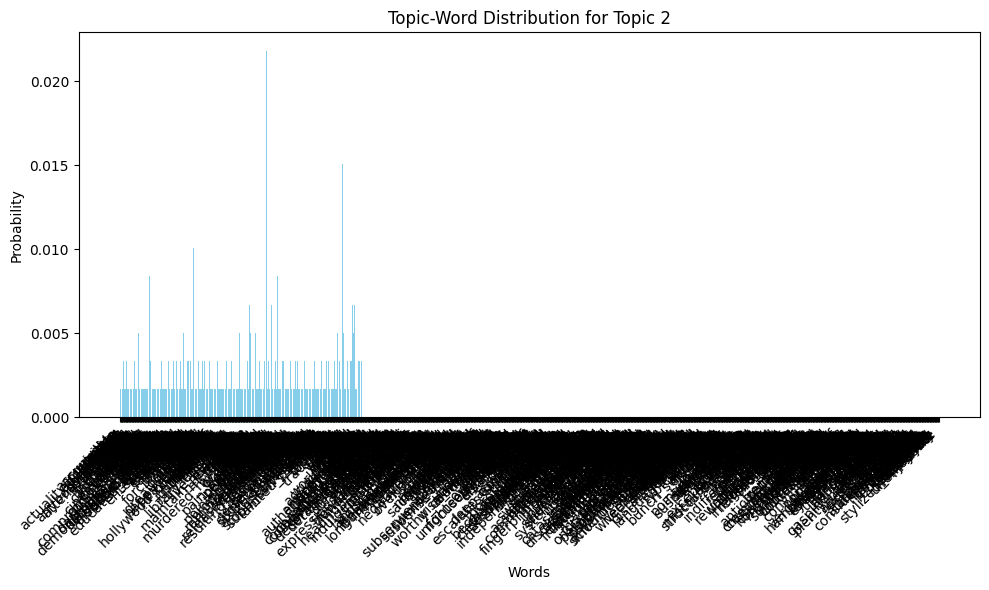

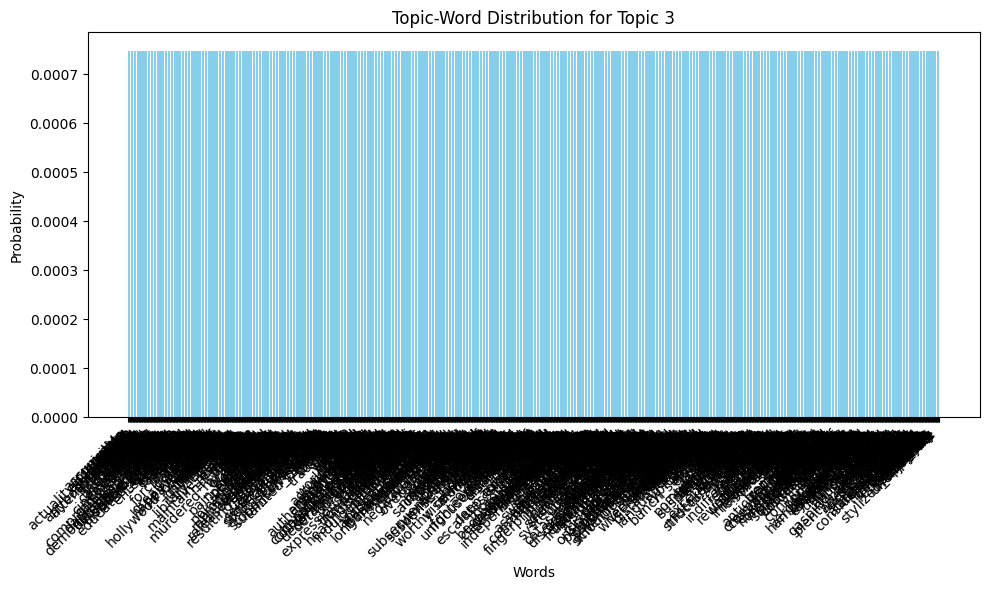

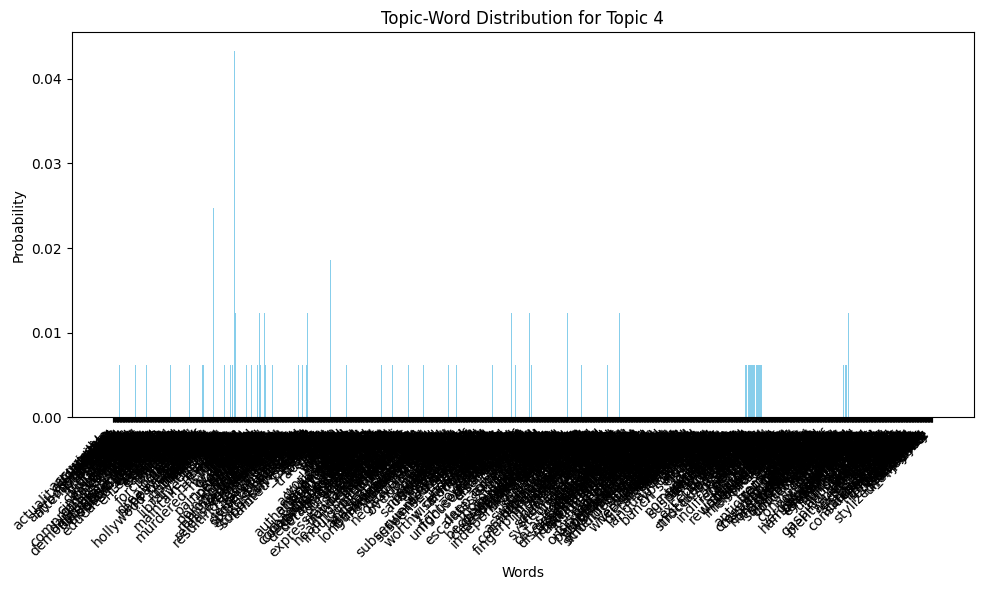

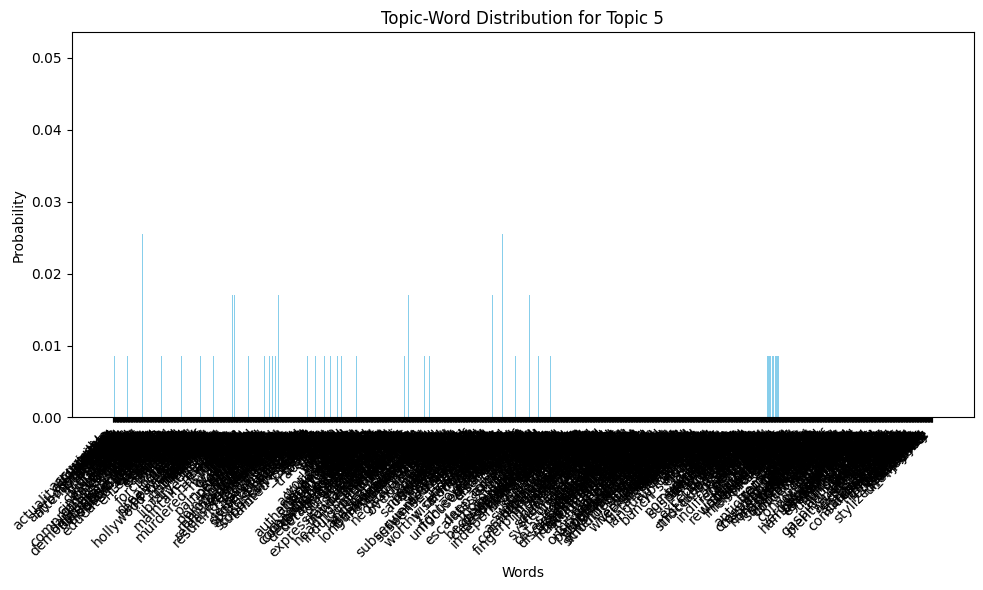

...

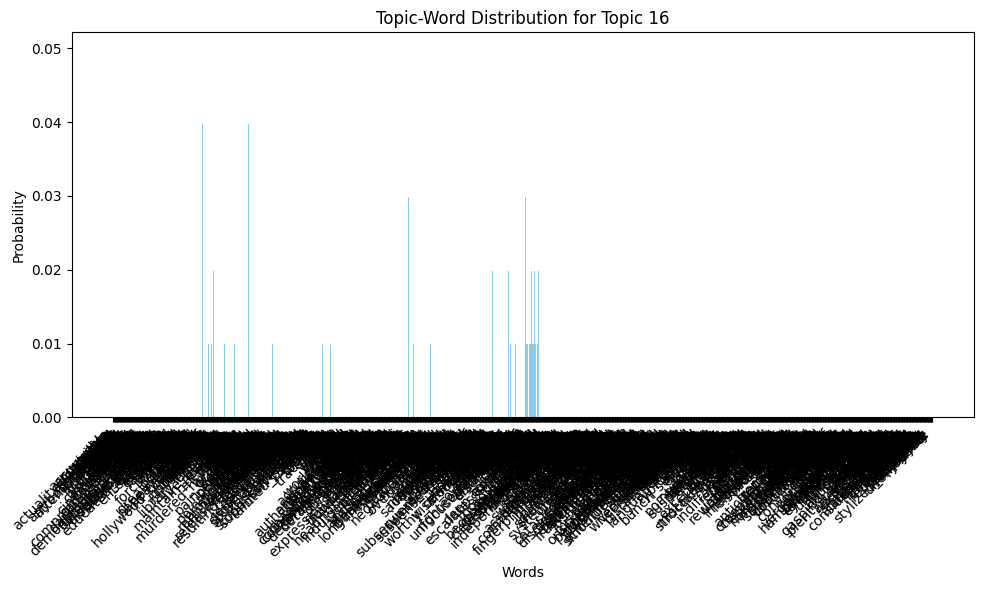

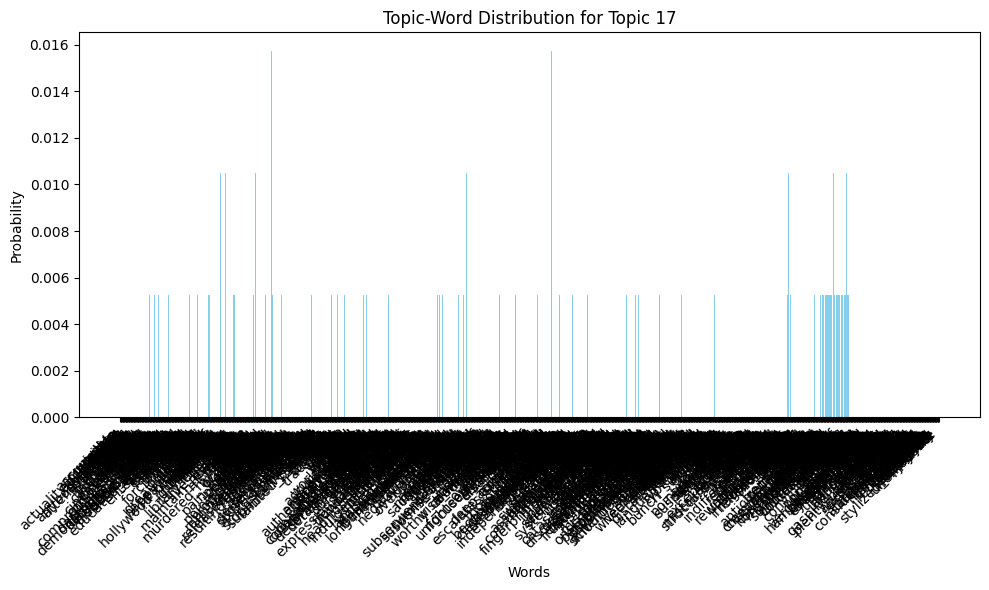

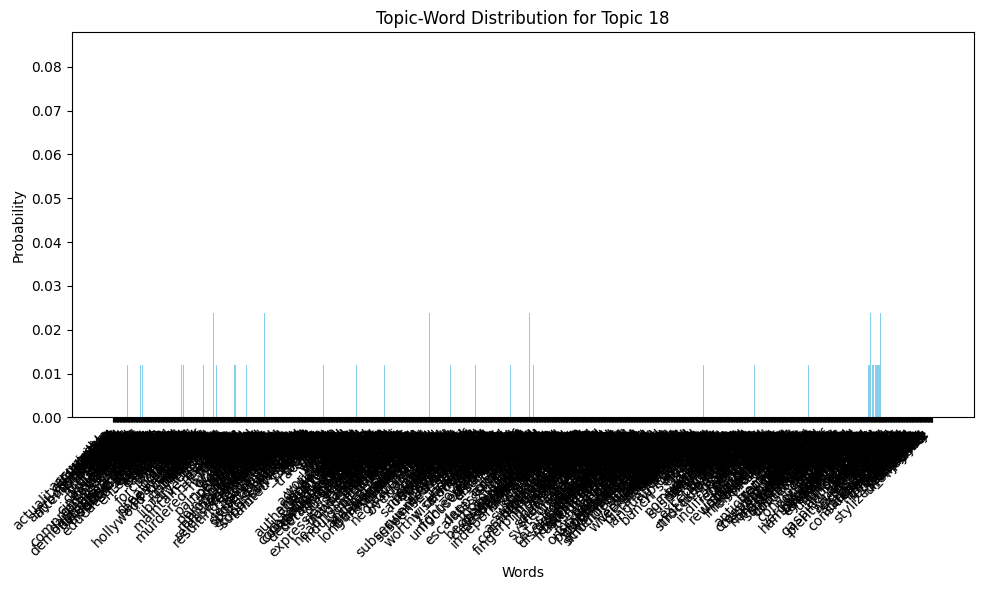

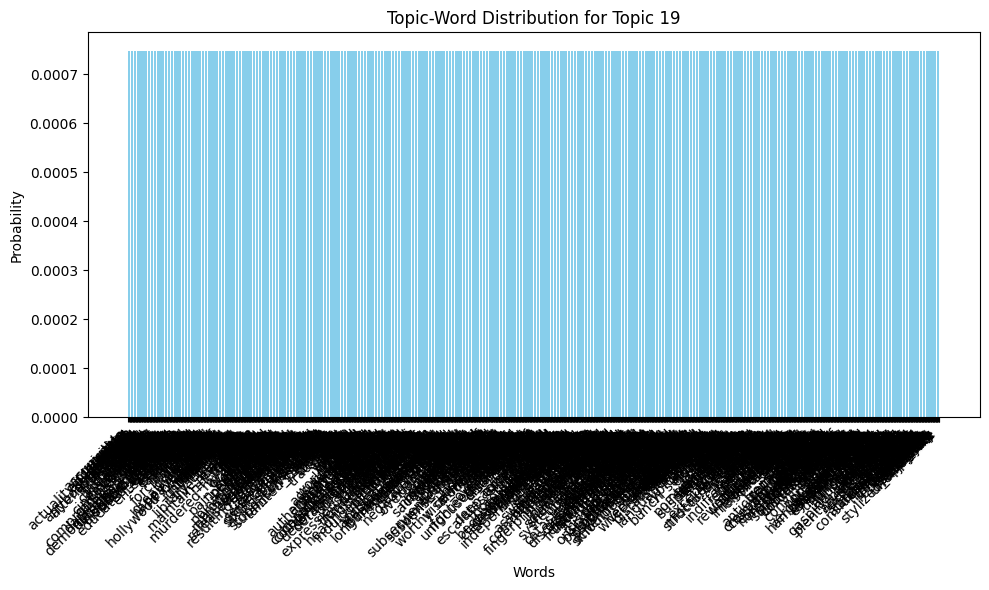

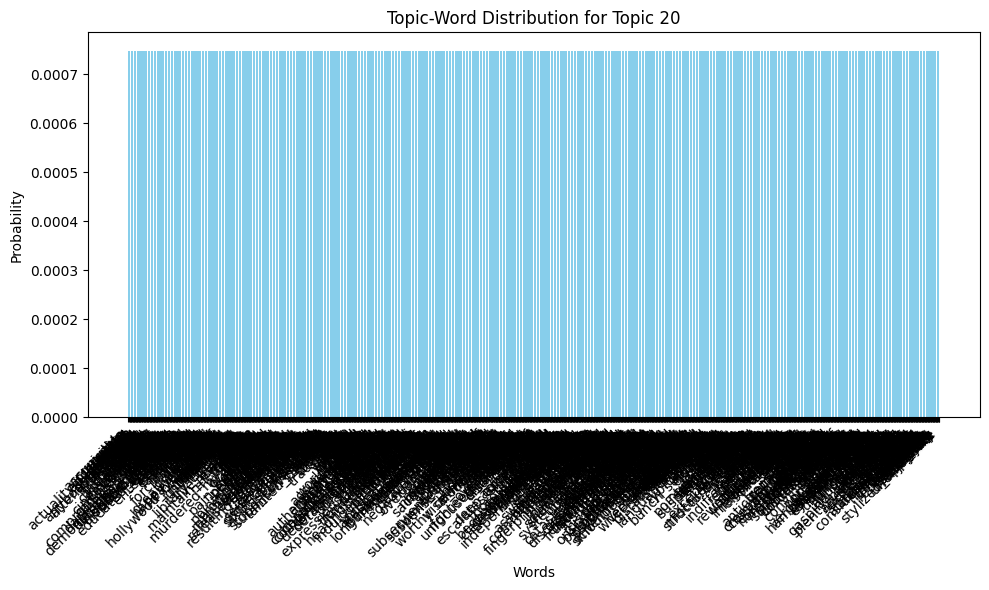

In [35]:
# 2. Topic-Word Distribution Bar Charts
topic_word_distributions = lda_model.get_topics()

for i, word_dist in enumerate(topic_word_distributions):
    words = [lda_model.id2word[word_idx] for word_idx in range(len(word_dist))]
    probs = word_dist
    plt.figure(figsize=(10, 6))
    plt.bar(words, probs, color='skyblue')
    plt.title(f'Topic-Word Distribution for Topic {i+1}')
    plt.xlabel('Words')
    plt.ylabel('Probability')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()


**Explanation:** Bar charts can explain the composition of words in each topic. Here each bar is a word, and height is related to the frequency of the word. This chart helps in detailed examination. X axis shows words related to topic, sorted by probability or frequency.

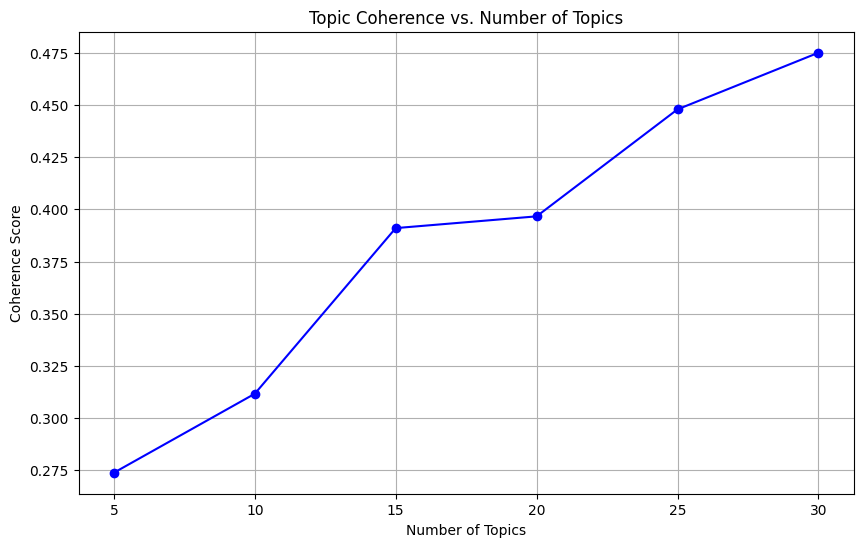

In [40]:
# Topic Coherence plot

import matplotlib.pyplot as plt
from gensim.models import CoherenceModel

# Initialize an empty list to store coherence scores
coherence_scores = []

# Define a range of candidate numbers of topics
num_topics_range = range(5, 31, 5)  # Adjust the range as needed

# Iterate over the candidate numbers of topics
for num_topics in num_topics_range:
    # Train an LDA model
    lda_model = gensim.models.LdaModel(
        corpus=review_corpus,
        id2word=review_id2word,
        num_topics=num_topics,
        random_state=100,
        update_every=1,
        chunksize=100,
        passes=10,
        alpha='auto',
        per_word_topics=True
    )

    # Calculate coherence score
    coherence_model = CoherenceModel(model=lda_model, texts=review_texts, dictionary=review_id2word, coherence='c_v')
    coherence_score = coherence_model.get_coherence()

    # Append coherence score to the list
    coherence_scores.append(coherence_score)

# Plot the topic coherence scores against the number of topics
plt.figure(figsize=(10, 6))
plt.plot(num_topics_range, coherence_scores, marker='o', color='b', linestyle='-')
plt.title('Topic Coherence vs. Number of Topics')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.xticks(num_topics_range)
plt.grid(True)
plt.show()



**Explanation: ** This plot visualizes the relationship between number of topics and the coherence score of the corresponding LDA models. X axis represents the number of topics. Y axis represents teh coherence score. The trend line shows the overall trend whether coherence increases or declines with number of topics.

## Extra Question (5 Points)

**Compare the results generated by the four topic modeling algorithms, which one is better? You should explain the reasons in details.**

**This question will compensate for any points deducted in this exercise. Maximum marks for the exercise is 40 points.**

In [36]:
# Write your code here
'''
LSA is a method for creating topic models by deconstructing matrices and determining the links among them and phrases. In the procedure, dimensions are reduced.
On the contrary hand, when loadings onto words are negative, it might be difficult to grasp. LSA has two basic inputs: a corpus and a dictionary.
LDA, abbreviated, is a method that connects words from one text to other phrases from an identical document. Its ability to handle difficult language with ease
is one of its most notable benefits. LDA often produces similar results for both highly and poorly rated goods in product reviews. LDA excels at maintaining major
topics while collecting data from the original document matrix. When compared to the combination of BERT and LDA, this capability has the potential to generate greater results.

'''

'\nLSA is a method for creating topic models by deconstructing matrices and determining the links among them and phrases. In the procedure, dimensions are reduced.\nOn the contrary hand, when loadings onto words are negative, it might be difficult to grasp. LSA has two basic inputs: a corpus and a dictionary.\nLDA, abbreviated, is a method that connects words from one text to other phrases from an identical document. Its ability to handle difficult language with ease\nis one of its most notable benefits. LDA often produces similar results for both highly and poorly rated goods in product reviews. LDA excels at maintaining major\ntopics while collecting data from the original document matrix. When compared to the combination of BERT and LDA, this capability has the potential to generate greater results.\n\n'

# Mandatory Question

**Important: Reflective Feedback on this exercise**

Please provide your thoughts and feedback on the exercises you completed in this assignment.

Consider the following points in your response:

**Learning Experience:** Describe your overall learning experience in working with text data and extracting features using various topic modeling algorithms. Did you understand these algorithms and did the implementations helped in grasping the nuances of feature extraction from text data.

**Challenges Encountered:** Were there specific difficulties in completing this exercise?

Relevance to Your Field of Study: How does this exercise relate to the field of NLP?

**(Your submission will not be graded if this question is left unanswered)**



In [37]:
# Your answer here (no code for this question, write down your answer as detail as possible for the above questions):

'''
It was great working with the text data and topic modeling was such a good thing to learn. These alogorithms helps us a lot to extract the topics from a text corpus. And these
algorithms were understandable as we spend a good amount of time on working on them through exercise and class demo section.

Coming to difficulties I faced few issues while working on 3rd question that is lda2vec. Remaing exercise took good amount of time to work, faced few complications while working
on codes but overcame with time.

This exercise is related to NLP is many ways, Text mining and analysis, Topic modeling, Model evaluation, visualization and Understanding the textual data all these shows how NLP
is applied in the process to get insights from the textual data. And these topics are clearly relevant to my feild of study as I'm a data science student.


'''

"\nIt was great working with the text data and topic modeling was such a good thing to learn. These alogorithms helps us a lot to extract the topics from a text corpus. And these\nalgorithms were understandable as we spend a good amount of time on working on them through exercise and class demo section.  \n\nComing to difficulties I faced few issues while working on 3rd question that is lda2vec. Remaing exercise took good amount of time to work, faced few complications while working \non codes but overcame with time.\n\nThis exercise is related to NLP is many ways, Text mining and analysis, Topic modeling, Model evaluation, visualization and Understanding the textual data all these shows how NLP\nis applied in the process to get insights from the textual data. And these topics are clearly relevant to my feild of study as I'm a data science student.                  \n\n\n"